<a href="https://colab.research.google.com/github/WafaBakir/edge_detection/blob/main/edge_detection_algos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow


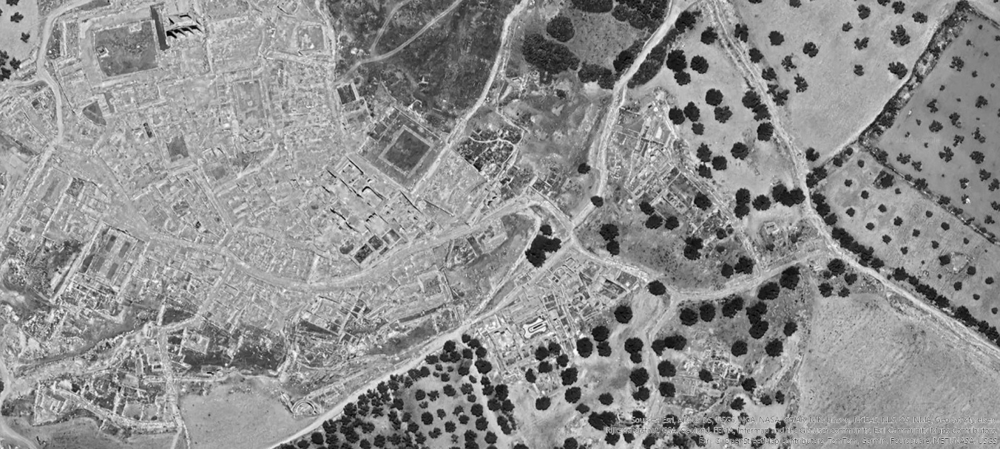

In [16]:
image = cv2.imread('/content/Arch of Septimus Severus.jpg')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Save the grayscale image
cv2.imwrite('output_grayscale_image.jpg', gray_image)
image1 = cv2.imread('output_grayscale_image.jpg')

# Convert the image from BGR to RGB (Matplotlib expects RGB)
image_rgb = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Display the image
cv2_imshow(image_rgb)
cv2.waitKey(0)
cv2.destroyAllWindows()

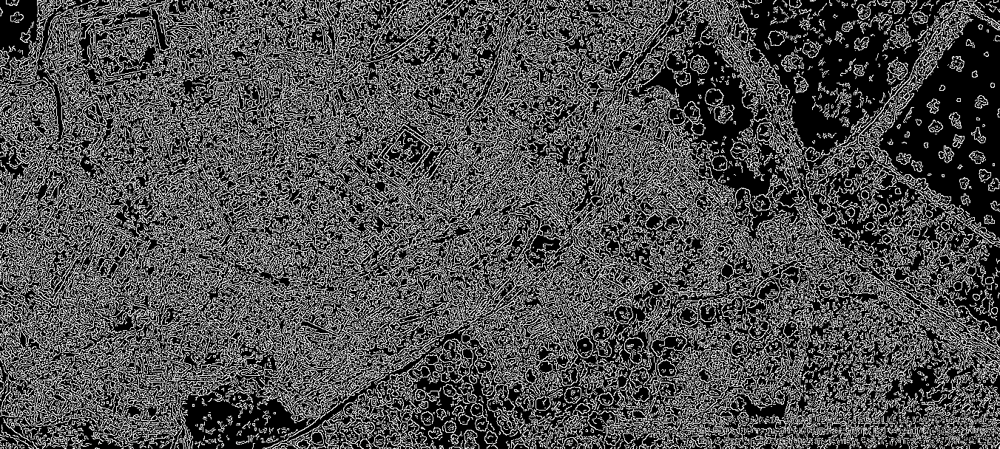

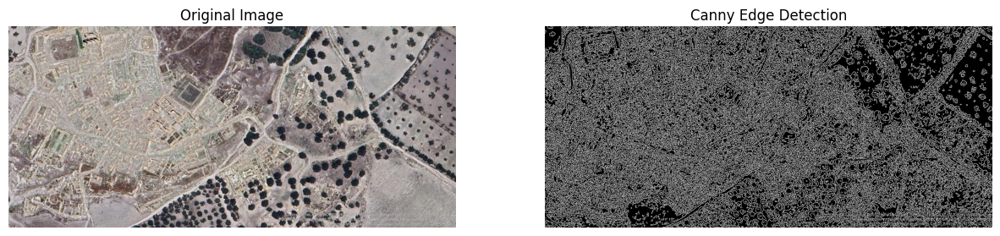

In [17]:
# Apply Canny edge detection
edges = cv2.Canny(gray_image, threshold1=50, threshold2=100)  # Adjust thresholds as needed
# Display the result
cv2_imshow(edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Display the original image and the edges
plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(edges, cmap='gray')
plt.title('Canny Edge Detection'), plt.axis('off')
plt.show()

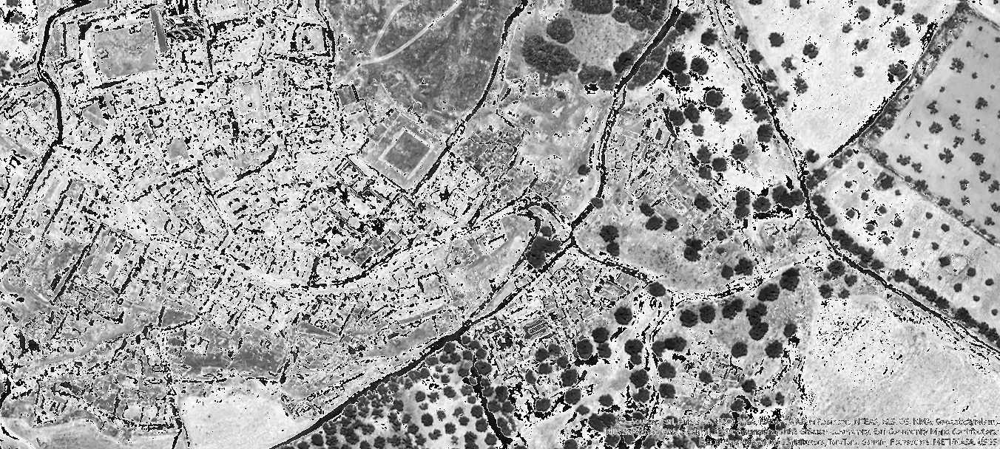

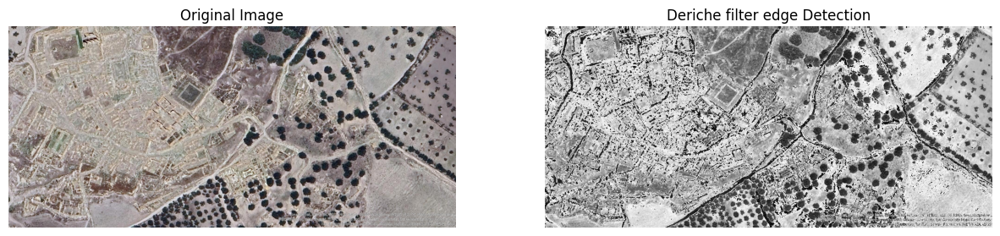

In [18]:
#apply Deriche Filter for edge detection
# Define Deriche filter coefficients
alpha = 4
omega = 1

# Compute Deriche coefficients
a0 = 1
a1 = -np.exp(-alpha) * np.cos(omega)
a2 = np.exp(-2 * alpha)
a3 = -2 * np.exp(-alpha) * np.cos(omega)
a4 = np.exp(-2 * alpha)

# Compute Deriche filter kernels
kernel_dx = np.array([a0, a1, a2, a3, a4])
kernel_dy = np.array([a0, a1, a2, a3, a4]).reshape(-1, 1)

# Apply Deriche edge detection
edges_dx = cv2.filter2D(image1.astype(np.float32), -1, kernel_dx)
edges_dy = cv2.filter2D(image1.astype(np.float32), -1, kernel_dy)
edges_magnitude = np.sqrt(edges_dx**2 + edges_dy**2)

# Convert edges_magnitude back to uint8 for display
edges_magnitude = edges_magnitude.astype(np.uint8)

# Display the result
cv2_imshow(edges_magnitude)
cv2.waitKey(0)
cv2.destroyAllWindows()
# Display the original image and the deriche filter
plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(edges_magnitude, cmap='gray')
plt.title('Deriche filter edge Detection'), plt.axis('off')
plt.show()

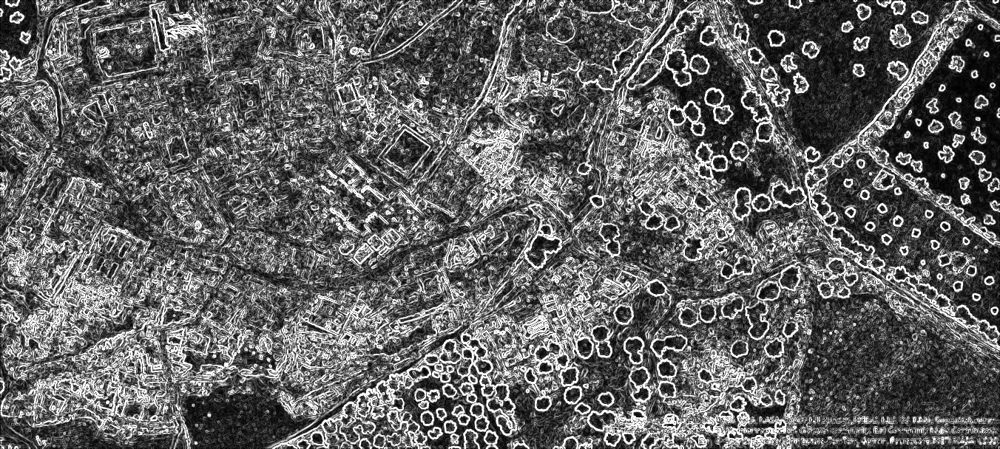

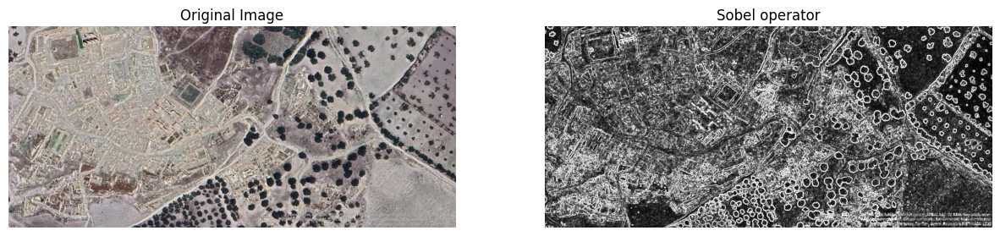

In [19]:
#apply Sobel Operator for Edge detection
# Apply Sobel operator in the x direction
sobel_x = cv2.Sobel(image1, cv2.CV_64F, 1, 0, ksize=3)

# Apply Sobel operator in the y direction
sobel_y = cv2.Sobel(image1, cv2.CV_64F, 0, 1, ksize=3)

# Compute the gradient magnitude
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

# Convert to uint8 for display
gradient_magnitude = cv2.convertScaleAbs(gradient_magnitude)

# Display the result
cv2_imshow(gradient_magnitude)
cv2.waitKey(0)
cv2.destroyAllWindows()
# Display the original image and the sobel operator
plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Sobel operator'), plt.axis('off')
plt.show()

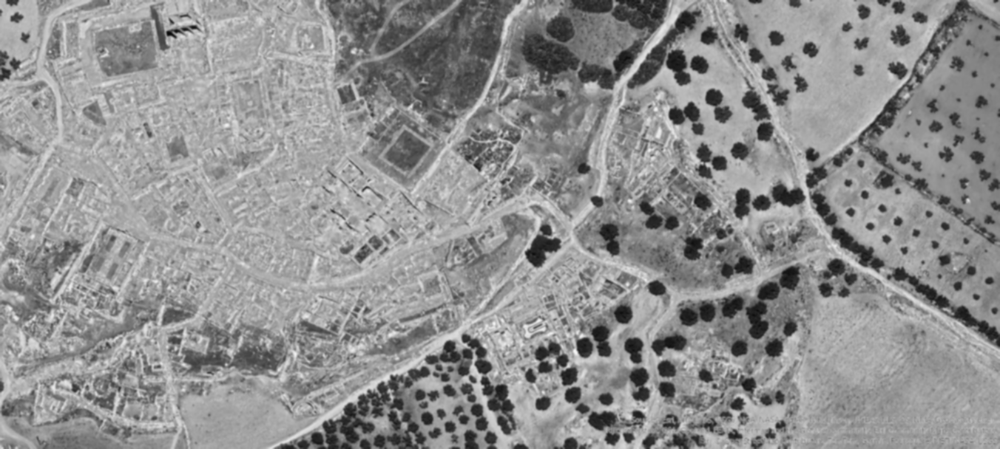

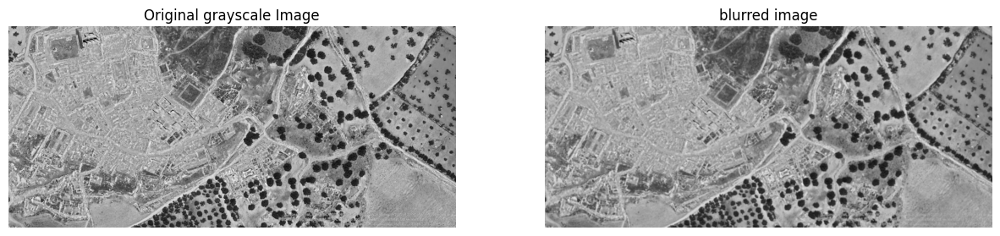

In [20]:
# Apply Gaussian blur with a specified kernel size
blurred_image = cv2.GaussianBlur(image1, (5, 5), 0)
cv2.imwrite('blur.jpg', blurred_image)

# Display the original and blurred images
cv2_imshow(blurred_image)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(0)
# Display the original image and the blurred image
plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.title('Original grayscale Image'), plt.axis('off')
plt.subplot(122), plt.imshow(blurred_image, cmap='gray')
plt.title('blurred image'), plt.axis('off')
plt.show()


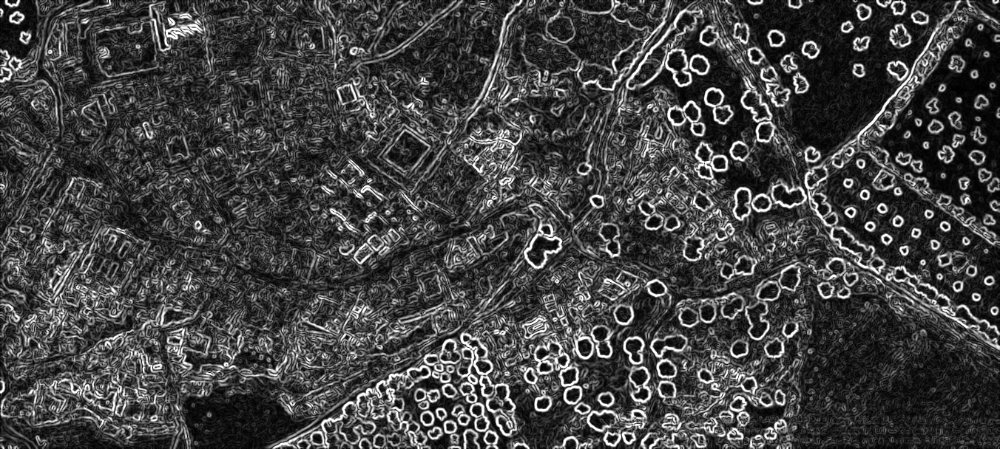

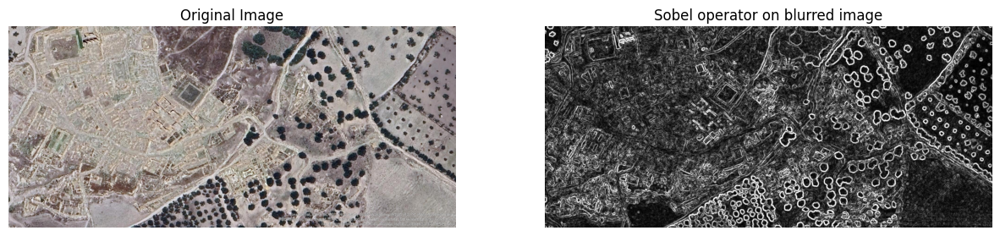

In [21]:
#Apply sobel operator on blurred image
blur= cv2.imread('blur.jpg')
# Apply Sobel operator in the x direction
sobel_x = cv2.Sobel(blur, cv2.CV_64F, 1, 0, ksize=3)

# Apply Sobel operator in the y direction
sobel_y = cv2.Sobel(blur, cv2.CV_64F, 0, 1, ksize=3)

# Compute the gradient magnitude
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

# Convert to uint8 for display
gradient_magnitude = cv2.convertScaleAbs(gradient_magnitude)

# Display the result
cv2_imshow(gradient_magnitude)
cv2.waitKey(0)
cv2.destroyAllWindows()
# Display the original image and the sobel operator on blurred image
plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Sobel operator on blurred image'), plt.axis('off')
plt.show()

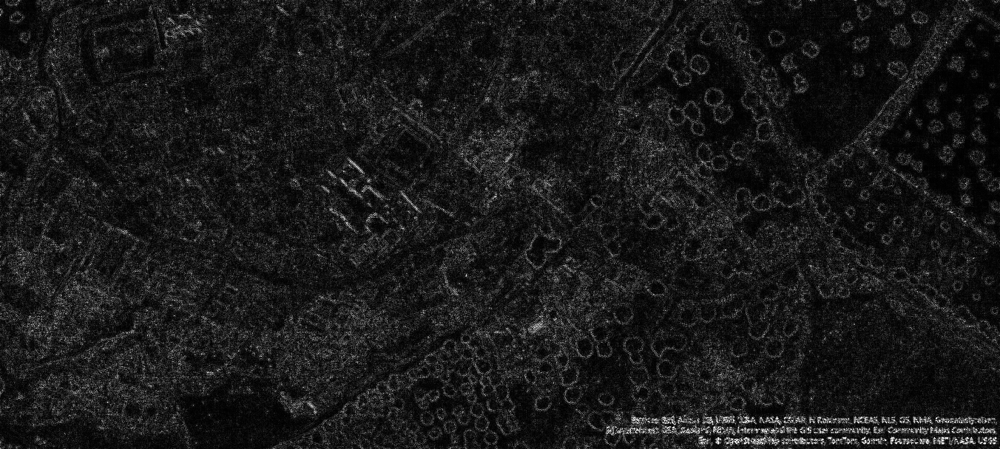

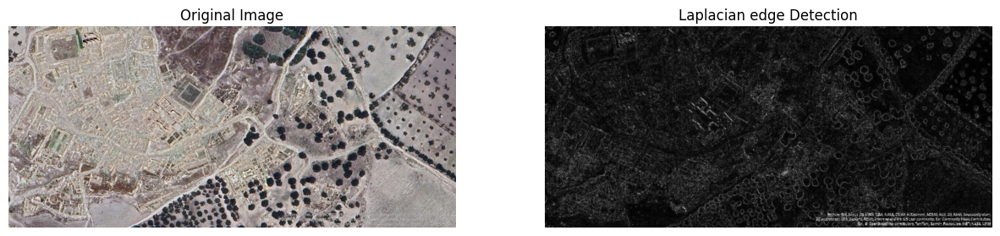

In [22]:
# Apply Laplace edge detection
laplacian = cv2.Laplacian(image1, cv2.CV_64F)

# Convert the result to uint8 for display
laplacian = cv2.convertScaleAbs(laplacian)

# Display the result
cv2_imshow(laplacian)
cv2.waitKey(0)
cv2.destroyAllWindows()
# Display the original image and the laplace edge detection
plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian edge Detection'), plt.axis('off')
plt.show()

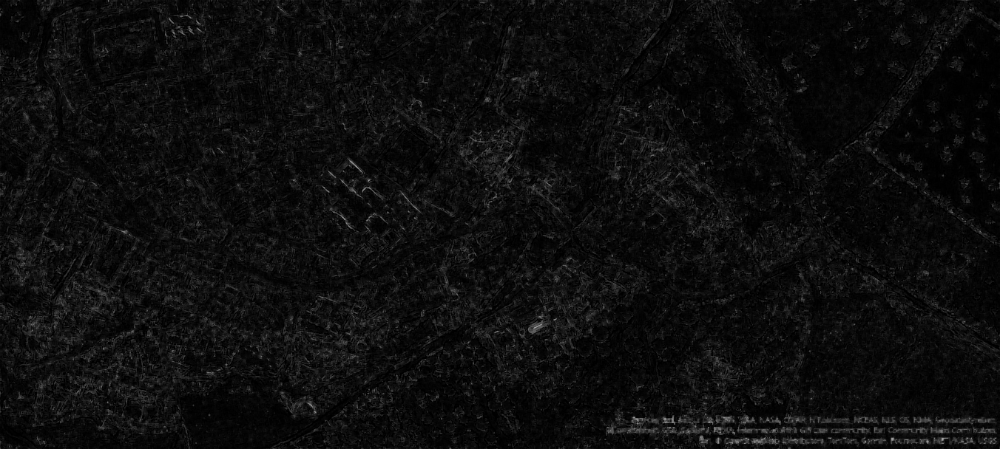

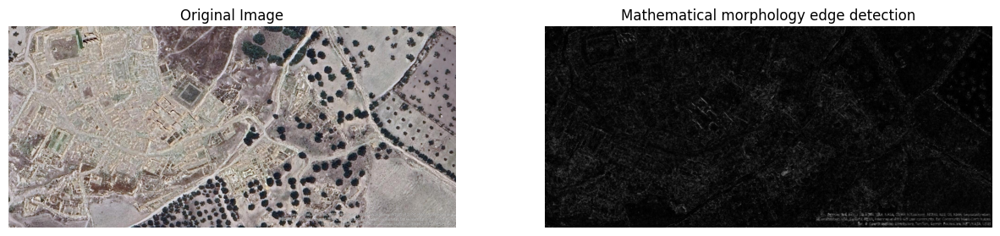

In [23]:
#Mathematical Morphology for edge detection
# Define a kernel for morphological operations
kernel = np.ones((3, 3), np.uint8)

# Perform dilation followed by erosion (closing operation)
closed_image = cv2.morphologyEx(image1, cv2.MORPH_CLOSE, kernel)

# Perform erosion followed by dilation (opening operation)
opened_image = cv2.morphologyEx(image1, cv2.MORPH_OPEN, kernel)

# Compute the edges by subtracting the opened image from the closed image
edges = closed_image - opened_image
# Display the result
cv2_imshow(edges)
cv2.waitKey(0)
cv2.destroyAllWindows()
# Display the original image and the mathematical morphology edge detected image
plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(edges, cmap='gray')
plt.title('Mathematical morphology edge detection'), plt.axis('off')
plt.show()

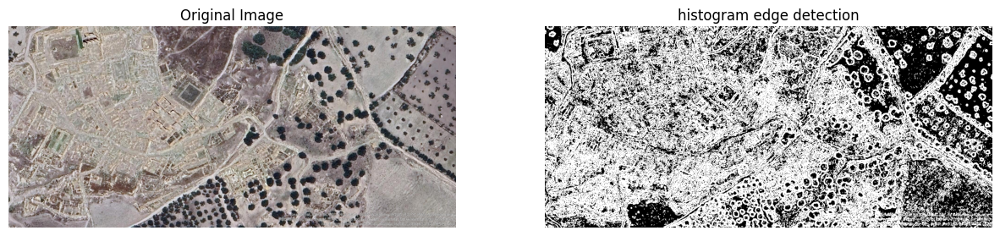

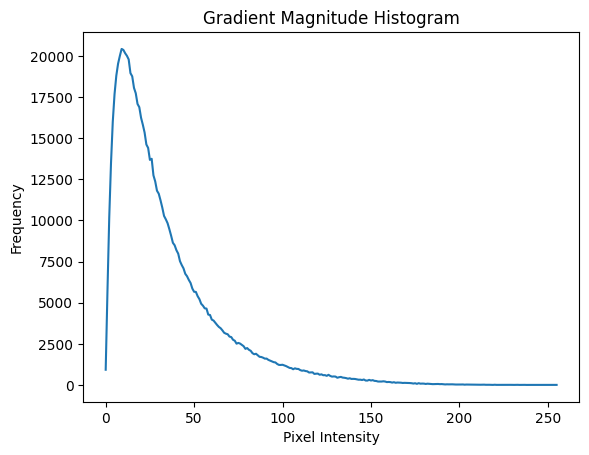

In [24]:

import cv2
import numpy as np
from matplotlib import pyplot as plt

def edge_detection(image):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Sobel operator in x and y directions
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)

    # Compute gradient magnitude
    gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

    # Normalize gradient magnitude to 0-255
    gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    # Calculate histogram of gradient magnitude
    hist = cv2.calcHist([gradient_magnitude], [0], None, [256], [0,256])

    # Find threshold using histogram analysis
    hist_max_index = np.argmax(hist)
    hist_threshold = hist_max_index * 2  # Adjust threshold as needed

    # Apply thresholding to obtain binary edge image
    _, edges = cv2.threshold(gradient_magnitude, hist_threshold, 255, cv2.THRESH_BINARY)

    return edges, hist

# Load image
image = cv2.imread('/content/Arch of Septimus Severus.jpg')

# Apply edge detection
edges, hist = edge_detection(image)

# Display the original image and the histogram
plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(edges, cmap='gray')
plt.title('histogram edge detection'), plt.axis('off')
plt.show()

# Display histogram
plt.figure()
plt.plot(hist)
plt.title('Gradient Magnitude Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

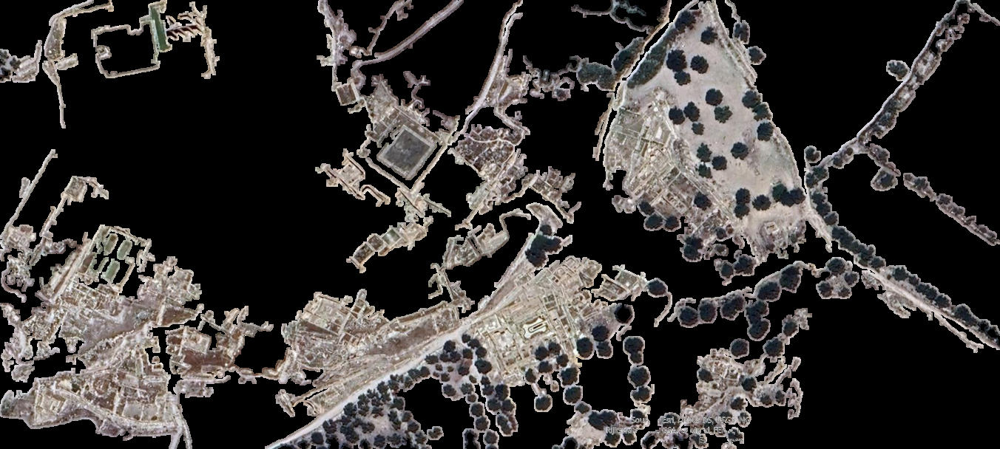

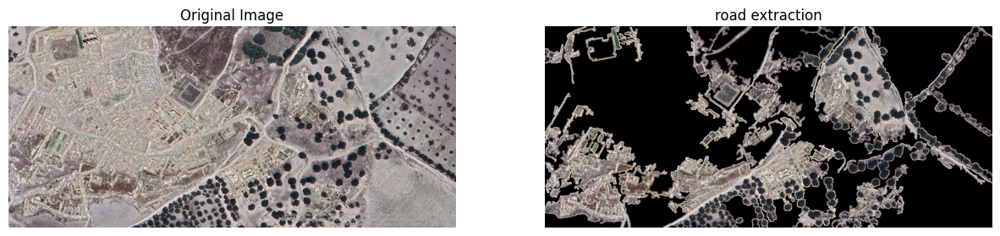

In [25]:
def extract_roads(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Perform edge detection
    edges = cv2.Canny(blurred, 80, 240)

    # Perform morphological closing to fill gaps in edges
    kernel = np.ones((5,5),np.uint8)
    closed_edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    # Find contours
    contours, _ = cv2.findContours(closed_edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a mask for road regions
    road_mask = np.zeros_like(gray)

    # Iterate over detected contours
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 1000:  # Adjust the minimum area threshold as needed
            cv2.drawContours(road_mask, [contour], -1, 255, -1)

    # Optional: Perform morphological operations to further refine the road mask
    road_mask = cv2.dilate(road_mask, kernel, iterations=1)
    road_mask = cv2.erode(road_mask, kernel, iterations=0)

    # Apply the mask to the original image
    result = cv2.bitwise_and(image, image, mask=road_mask)

    return result

# Load the image
image = cv2.imread('/content/Arch of Septimus Severus.jpg')

# Extract roads
road_extraction_result = extract_roads(image)

# Display the result
cv2_imshow(road_extraction_result)
cv2.waitKey(0)
cv2.destroyAllWindows()
# Display the original image and the extracted road
plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(cv2.cvtColor(road_extraction_result, cv2.COLOR_BGR2RGB))
plt.title('road extraction'), plt.axis('off')
plt.show()
